# Thông tin


*   Họ và tên: Lê Trọng Đại Trường
*   MSSV: 22521576



# Bài làm


In [1]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [8]:
!unrar x '/content/drive/MyDrive/Baitap.rar'


UNRAR 6.11 beta 1 freeware      Copyright (c) 1993-2022 Alexander Roshal


Extracting from /content/drive/MyDrive/Baitap.rar

Creating    Baitap5                                                   OK
Creating    Baitap5/images                                            OK
Extracting  Baitap5/images/camourflage_00470.jpg                           0%  1%  2%  3%  4%  5%  6%  7%  8%  9% 10% 11% 12% 13% 14% 15% 16% 17% 18% 19% 20% 21% 22% 23% 24% 25% 26% 27% 28% 29% 30% 31% 32% 33% 34%  OK 
Extracting  Baitap5/images/camourflage_00471.jpg                          35%  OK 
Extracting  Baitap5/images/camourflage_00473.jpg                          35% 36%  OK 
Extracting  Baitap5/images/camourflage_00478.jpg                          38%  OK 
Extracting  Baitap5/images/camourflage_00496.jpg                          3

## Yêu cầu 1: Faster-RCNN

In [2]:
import torch
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision import transforms
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches


In [37]:
class FasterRCNN:
    def __init__(self, image_dir):
        # Khởi tạo mô hình Faster R-CNN pretrained và thư mục ảnh
        self.model = fasterrcnn_resnet50_fpn(pretrained=True).eval()
        self.image_dir = image_dir
        self.images = self._load_images(image_dir)

    def _load_images(self, image_dir):
        # Tải ảnh và chuyển đổi thành tensor
        return {
            image_file.name: transforms.ToTensor()(Image.open(image_file).convert('RGB'))
            for image_file in Path(image_dir).glob('*')
            if image_file.suffix.lower() in ['.jpg', '.png']
        }

    def predict(self, image_filename, target_label=None, threshold=0.5):
        # Dự đoán bounding box và nhãn
        image_tensor = self.images[image_filename]
        with torch.no_grad():
            prediction = self.model([image_tensor])[0]
        scores = prediction['scores']
        mask = scores >= threshold
        boxes = prediction['boxes'][mask].tolist()
        labels = prediction['labels'][mask].tolist()
        target_count = labels.count(target_label) if target_label else len(labels)
        return boxes, labels, target_count

    def plot_people(self, boxes, labels, image_filename):
        # Vẽ bounding box lên ảnh
        image = self.images[image_filename].permute(1, 2, 0).numpy()
        fig, ax = plt.subplots()
        ax.imshow(image)
        for box, label in zip(boxes, labels):
          if label == 1:
            x_min, y_min, x_max, y_max = box
            rect = patches.Rectangle(
                (x_min, y_min), x_max - x_min, y_max - y_min,
                linewidth=1, edgecolor='green', facecolor='none'
            )
            ax.add_patch(rect)
        plt.axis('off')
        plt.show()

    def plot_obj(self, boxes, labels, image_filename):
        # Vẽ bounding box lên ảnh
        image = self.images[image_filename].permute(1, 2, 0).numpy()
        fig, ax = plt.subplots()
        ax.imshow(image)
        for box, label in zip(boxes, labels):
            x_min, y_min, x_max, y_max = box
            rect = patches.Rectangle(
                (x_min, y_min), x_max - x_min, y_max - y_min,
                linewidth=1, edgecolor='green', facecolor='none'
            )
            ax.add_patch(rect)
        plt.axis('off')
        plt.show()


In [39]:
faster_rcnn_model = FasterRCNN(image_dir='/content/Baitap5/images')

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Số lượng người có trong ảnh:  8


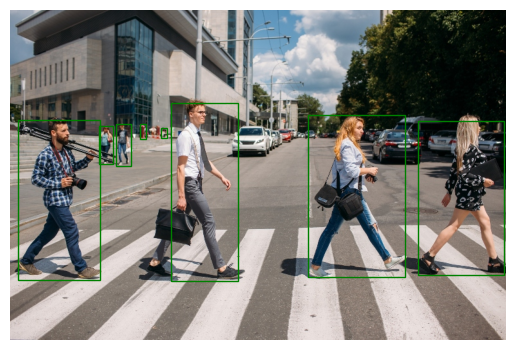

Số lượng người có trong ảnh:  19


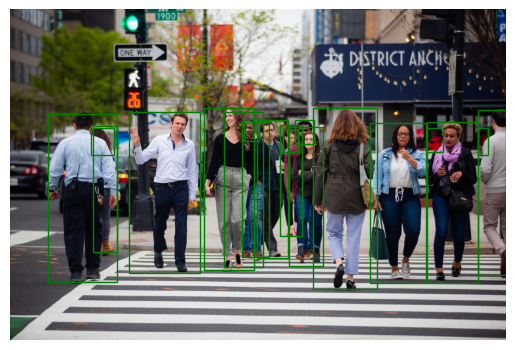

Số lượng người có trong ảnh:  1


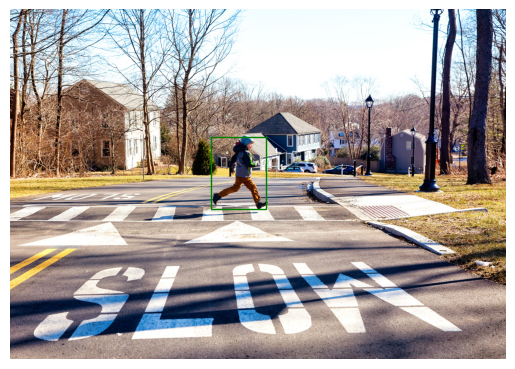

Số lượng người có trong ảnh:  42


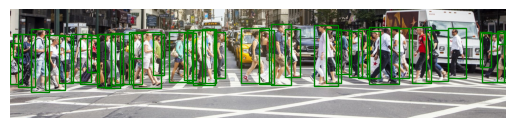

Số lượng người có trong ảnh:  35


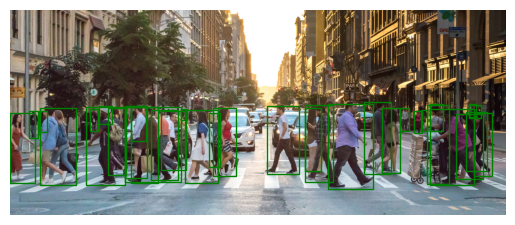

In [40]:
image_filenames = ['Pedestrian_01.jpg', 'Pedestrian_02.jpg', 'pedestrian-03.jpg', 'pedestrian-04.jpg', 'pedestrian-05.jpg']
for image_filename in image_filenames:
  boxes, labels, target_count = faster_rcnn_model.predict(image_filename, target_label=1)
  print('Số lượng người có trong ảnh: ', target_count)
  faster_rcnn_model.plot_people(boxes, labels, image_filename=image_filename)

In [43]:
threshold = 0.3

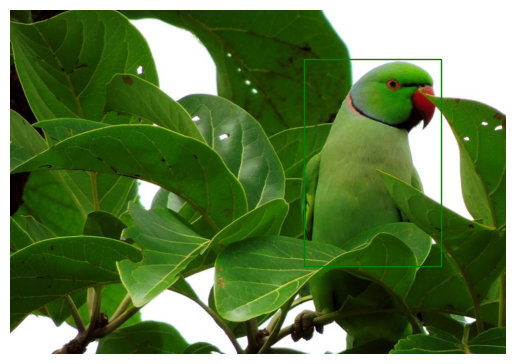

In [48]:
boxes, labels, _ = faster_rcnn_model.predict('camourflage_00473.jpg', threshold=threshold)
faster_rcnn_model.plot_obj(boxes, labels, image_filename='camourflage_00473.jpg')

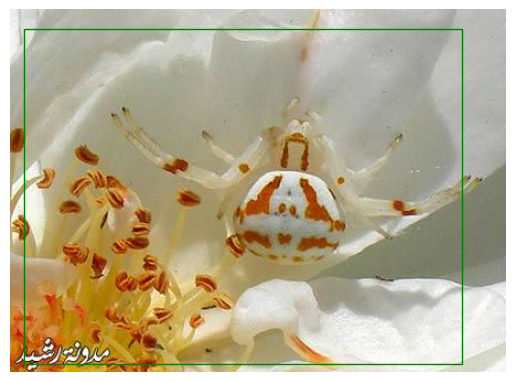

In [49]:
boxes, labels, _ = faster_rcnn_model.predict('camourflage_00498.jpg', threshold=threshold)
faster_rcnn_model.plot_obj(boxes, labels, image_filename='camourflage_00498.jpg')

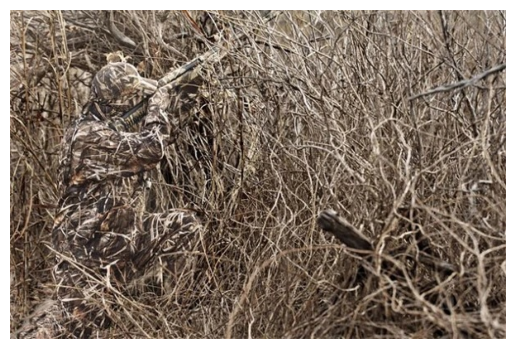

In [50]:
boxes, labels, _ = faster_rcnn_model.predict('linh-ban-tia-2.jpg', threshold=threshold)
faster_rcnn_model.plot_people(boxes, labels, image_filename='linh-ban-tia-2.jpg')

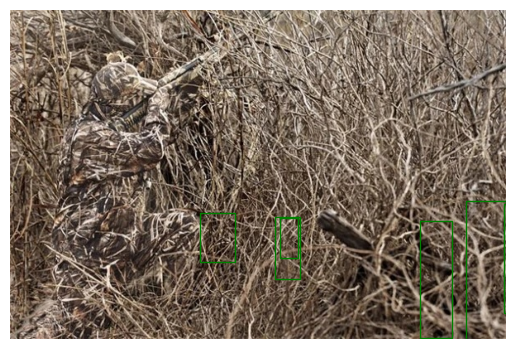

In [51]:
boxes, labels, _ = faster_rcnn_model.predict('linh-ban-tia-5.jpg', threshold=threshold)
faster_rcnn_model.plot_people(boxes, labels, image_filename='linh-ban-tia-2.jpg')

## Yêu cầu 2: YOLO

In [59]:
!git clone https://github.com/ultralytics/yolov5.git
%cd yolov5
!pip install -r requirements.txt

Cloning into 'yolov5'...
remote: Enumerating objects: 17063, done.
remote: Counting objects: 100% (41/41), done.
remote: Compressing objects: 100% (29/29), done.
remote: Total 17063 (delta 21), reused 27 (delta 12), pack-reused 17022 (from 1)
Receiving objects: 100% (17063/17063), 15.68 MiB | 18.52 MiB/s, done.
Resolving deltas: 100% (11716/11716), done.
/content/yolov5


In [60]:
import torch
import cv2
import matplotlib.pyplot as plt

model = torch.hub.load('ultralytics/yolov5', 'yolov5s')  # yolov5s is the small version

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-11-24 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

100%|██████████| 14.1M/14.1M [00:00<00:00, 188MB/s]

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


In [61]:
def count_persons_YOLO(image_path):
  %matplotlib inline
  # Load YOLO model (pretrained)


  # Load an image
  img = cv2.imread(image_path)


  # Perform detection
  results = model(img)

  # Extract detections
  detections = results.pandas().xyxy[0]  # Results as pandas DataFrame
  person_detections = detections[detections['name'] == 'person']  # Filter 'person'

  # Count the number of persons
  num_persons = len(person_detections)
  print(f"Số lượng người trong ảnh: {num_persons}")

  # Visualize results on the image
  for index, row in person_detections.iterrows():
      x1, y1, x2, y2, confidence = int(row['xmin']), int(row['ymin']), int(row['xmax']), int(row['ymax']), row['confidence']
      label = f"Person {confidence:.2f}"
      # Vẽ bounding box
      cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Màu xanh lá
      cv2.putText(img, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)  # Text màu xanh dương

  # Convert BGR to RGB for visualization
  img_rgb_with_boxes = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

  # Display the image with bounding boxes
  plt.figure(figsize=(10, 8))
  plt.imshow(img_rgb_with_boxes)
  plt.axis('off')
  plt.title(f"Detected Persons: {num_persons}")
  plt.show()


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


Số lượng người trong ảnh: 7


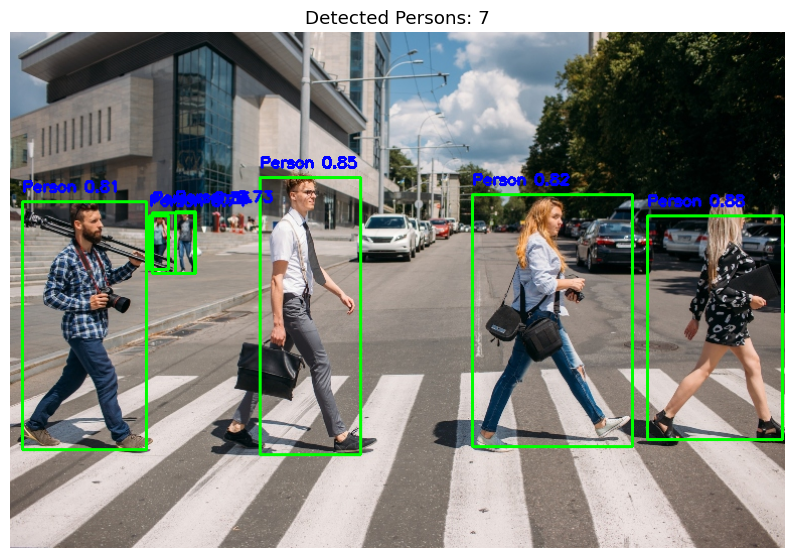

In [62]:
count_persons_YOLO('/content/Baitap5/images/Pedestrian_01.jpg')

/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


Số lượng người trong ảnh: 11


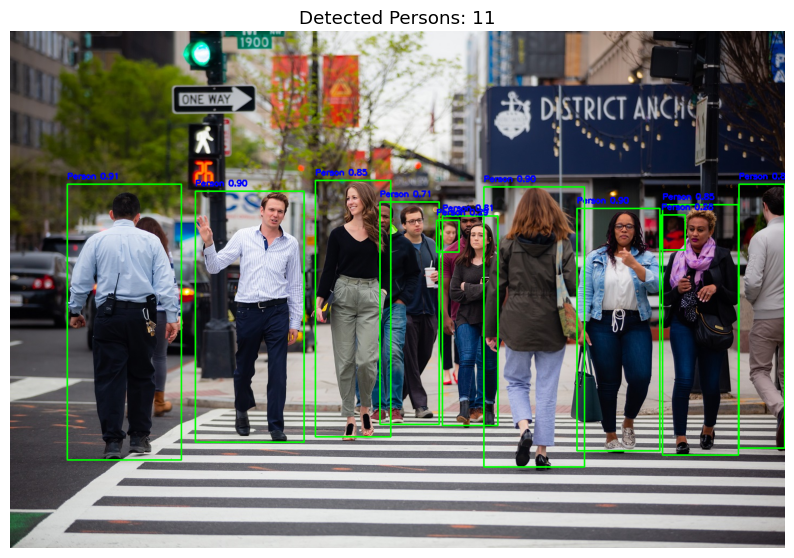

In [63]:
count_persons_YOLO('/content/Baitap5/images/Pedestrian_02.jpg')

/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


Số lượng người trong ảnh: 2


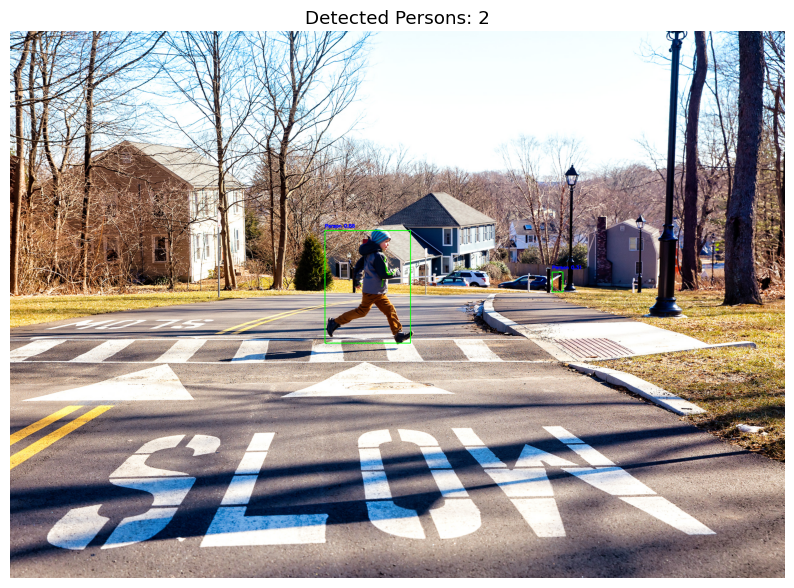

In [120]:
count_persons_YOLO('/content/Baitap5/images/pedestrian-03.jpg')

/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


Số lượng người trong ảnh: 15


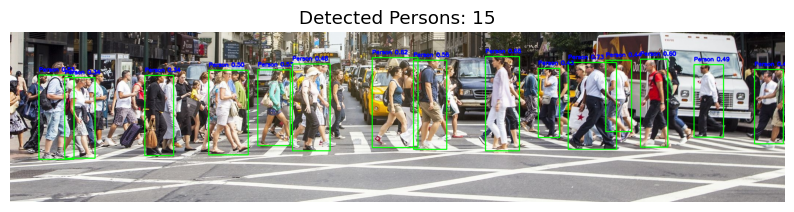

In [121]:
count_persons_YOLO('/content/Baitap5/images/pedestrian-04.jpg')

/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


Số lượng người trong ảnh: 18


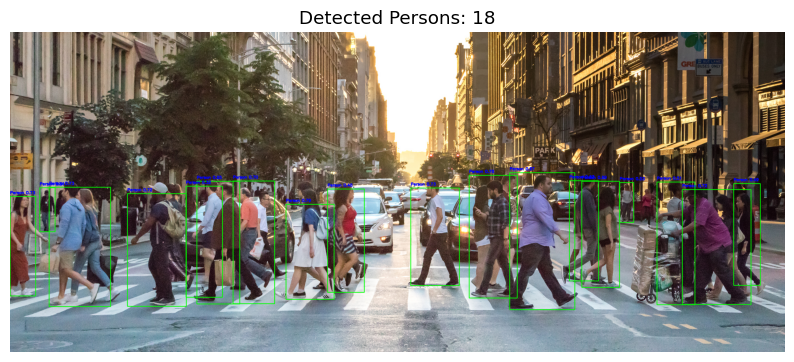

In [122]:
count_persons_YOLO('/content/Baitap5/images/pedestrian-05.jpg')

In [90]:
def detect_obj_YOLO(image_path):
  %matplotlib inline
  # Load YOLO model (pretrained)


  # Load an image
  img = cv2.imread(image_path)
  model.conf = 0.01  # Set the confidence threshold for object detection

  # Perform detection
  results = model(img)

  # Extract detections
  detections = results.pandas().xyxy[0]  # Results as pandas DataFrame



  # Visualize results on the image
  for index, row in detections.iterrows():
      x1, y1, x2, y2, confidence = int(row['xmin']), int(row['ymin']), int(row['xmax']), int(row['ymax']), row['confidence']
      # Vẽ bounding box
      cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Màu xanh lá


  # Convert BGR to RGB for visualization
  img_rgb_with_boxes = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

  # Display the image with bounding boxes
  plt.figure(figsize=(10, 8))
  plt.imshow(img_rgb_with_boxes)
  plt.axis('off')
  print("Số lượng Obj: ",len(detections))
  plt.show()


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


Số lượng Obj:  9


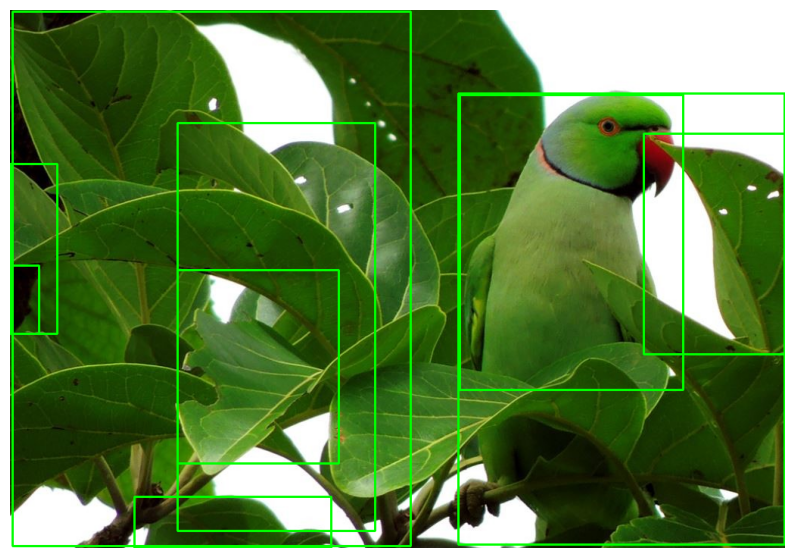

In [91]:
detect_obj_YOLO('/content/Baitap5/images/camourflage_00473.jpg')

/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


Số lượng Obj:  10


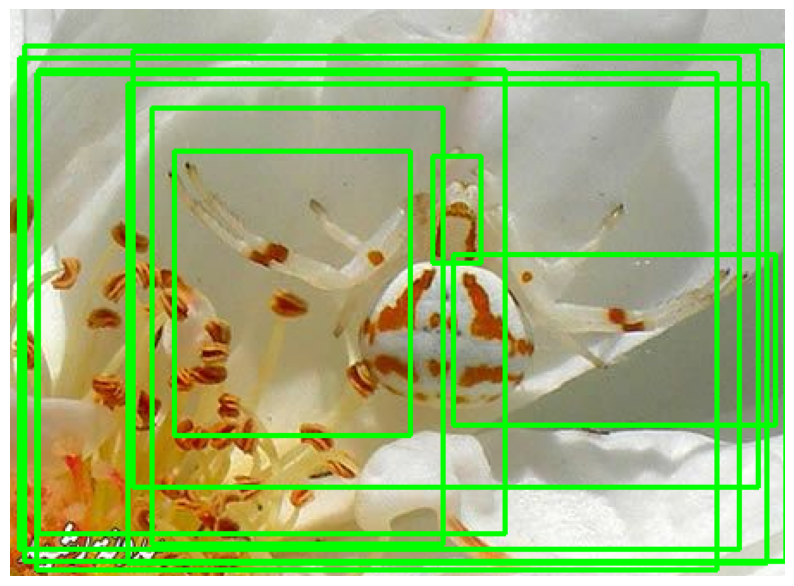

In [92]:
detect_obj_YOLO('/content/Baitap5/images/camourflage_00498.jpg')

/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


Số lượng Obj:  2


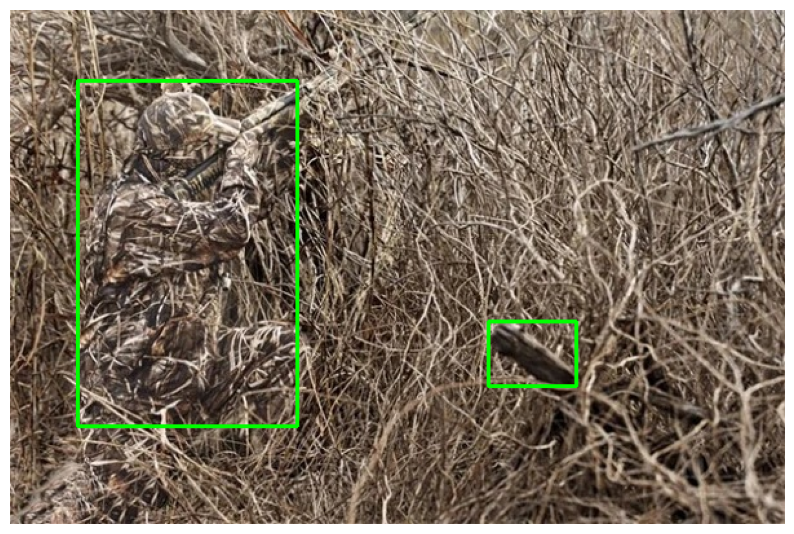

In [93]:
detect_obj_YOLO('/content/Baitap5/images/linh-ban-tia-2.jpg')

/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


Số lượng Obj:  36


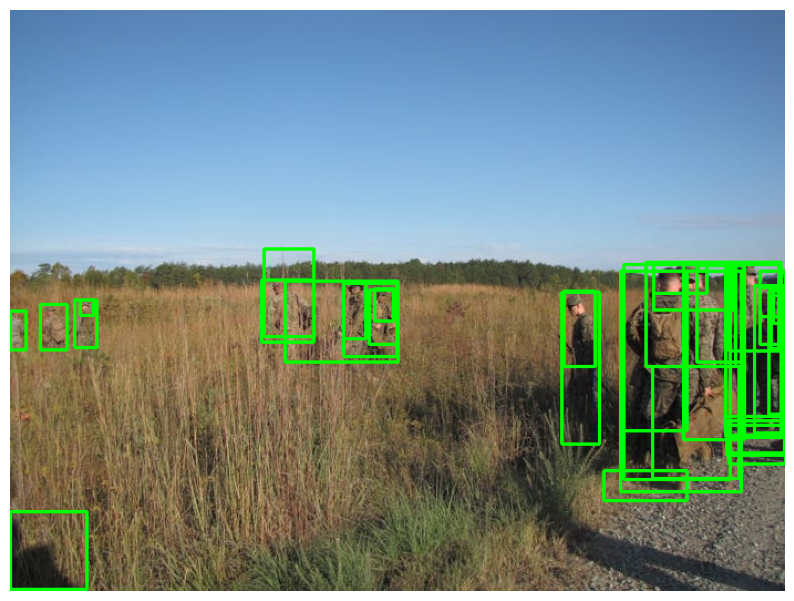

In [94]:
detect_obj_YOLO('/content/Baitap5/images/linh-ban-tia-5.jpg')

## Yêu cầu 3: So sánh

In [53]:
import torch
import time

In [56]:
start = time.time()
boxes, labels, target_count = faster_rcnn_model.predict(image_filename, threshold=0.5)
end = time.time()
print(f"Thời gian detect của Faster-RCNN: {end - start}")

Thời gian detect của Faster-RCNN: 4.266247272491455


In [57]:
model = torch.hub.load('ultralytics/yolov5', 'yolov5s', source='github')
img_path = '/content/Baitap5/images/pedestrian-05.jpg'

/usr/local/lib/python3.10/dist-packages/torch/hub.py:330: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


YOLOv5 🚀 2024-11-24 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

100%|██████████| 14.1M/14.1M [00:00<00:00, 114MB/s] 

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


In [58]:

# Measure inference time
start_time = time.time()
results = model(img_path)
end_time = time.time()

# Output time
print(f"YOLOv5 Inference Time: {end_time - start_time:.2f} seconds")


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
WARNING ⚠️ NMS time limit 0.550s exceeded


YOLOv5 Inference Time: 1.05 seconds
